In [1]:
import pandas as pd
import numpy as np
from pyemd import emd_samples
from scipy import signal
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from IPython.display import display
from tqdm.notebook import tqdm

import os
import psutil
from multiprocessing import Manager, Process

# To import packages from the parent directory
import sys
sys.path.insert(0,'..')

# Autoreload allows us to update our code mid-notebook
%load_ext autoreload
%autoreload 2

# Our code
from main.processing import *
from main.visualization import *

In [2]:
# file_path = '../data/20200628-1935_states.pickle'
file_path = '../data/20200706-1703_inter_states.pickle'
df = pd.read_pickle(file_path)
print(f'Length of df: {len(df)}')

Length of df: 2400


In [3]:
df = df[df.version < 10]
inter_states = []
for grouping, group in df.groupby(['BR', 'CHI', 'version']):
    inter_state = group[group.timestep == 1].iloc[0]
    inter_states.append(inter_state)
    
df_inters = pd.DataFrame(inter_states)

# Plot 4x4 BR/CHI Samples

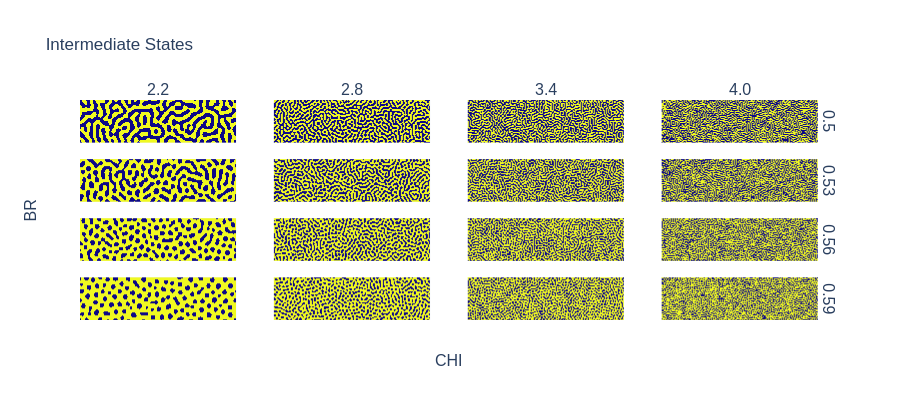

In [12]:
fig = make_subplots(
    rows=4,
    cols=4,
    x_title='CHI',
    y_title='BR',
    row_titles=list(df_inters.BR.unique()),
    column_titles=list(df_inters.CHI.unique())
)
row = 1
col = 1
for idx, sample in df_inters[df_inters.version == 0].iterrows():
    heatmap, layout = get_image_figure(
        binarize(np.array(sample.image).reshape((100, 400)), 0.5),
        return_figure=False
    )
    fig.add_trace(
        heatmap,
        row=row,
        col=col
    )
    fig.update_xaxes(
        showgrid=False,
        zeroline=False,
        visible=False,
        row=row,
        col=col
    )
    fig.update_yaxes(
        showgrid=False,
        zeroline=False,
        visible=False,
        row=row,
        col=col
    )
    col += 1
    if col > 4:
        col = 1
        row += 1
fig.update_layout(title_text='Intermediate States', width=1000, height=400)
display(fig)

# Calculate Signatures

In [5]:
%%time

sig_funcs = [
    area_sig,
    perimeter_sig,
    euler_number_sig,
    length_sig,
    height_sig
]

thresh = 0.5
binarize_sample = True

df_sigs = df_inters.copy()
for sig_func in sig_funcs:
    df_sigs[sig_func.__name__] = np.empty(len(df_sigs), dtype=np.object)

df_sigs['average_pixel_intensity'] = np.empty(len(df_sigs), dtype=np.object)
df_sigs['welch'] = np.empty(len(df_sigs), dtype=np.object)
df_sigs['fft'] = np.empty(len(df_sigs), dtype=np.object)

for idx, row in df_sigs.iterrows():
    comp_sample = np.array(row.image).reshape((100, 400))
    if binarize_sample:
        comp_sample = binarize(comp_sample, thresh)
    comp_components = extract_components(comp_sample, background=1)
    for sig_func in sig_funcs:
        df_sigs.at[
            idx,
            sig_func.__name__
        ] = apply_to_components(comp_components, sig_func)
    
    df_sigs.at[idx, 'average_pixel_intensity'] = np.mean(comp_sample)
    
    f, pxx = signal.welch(comp_sample)
    df_sigs.at[idx, 'welch'] = pxx
    
    df_sigs.at[idx, 'fft'] = np.fft.fft2(comp_sample)

CPU times: user 25.8 s, sys: 119 ms, total: 25.9 s
Wall time: 25.9 s


# Calculate Distances

In [6]:
def get_dist_df(sample):
    dist_data = []

    for idx, row in df_sigs.iterrows():
        row_dist_data = {
            'BR': row.BR,
            'CHI': row.CHI,
            'version': row.version,
            'image': row.image,
            'l2_average_pixel_intensity': np.linalg.norm(row.average_pixel_intensity - sample.average_pixel_intensity),
            'l2_welch': np.linalg.norm(row.welch - sample.welch),
            'l2_fft': np.linalg.norm(row.fft - sample.fft)
        }
        
        # Calculate EMD for each sig_func
        for sig_func in sig_funcs:
            row_dist_data[f'emd_{sig_func.__name__}'] = emd_samples(row[sig_func.__name__], sample[sig_func.__name__]),
            
        # Calculate EMD for mixed sig
        row_dist_data['emd_mixed'] = emd_samples(
            np.stack([
                row[sig_func.__name__] for sig_func in sig_funcs
            ], axis=1),
            np.stack([
                sample[sig_func.__name__] for sig_func in sig_funcs
            ], axis=1)
        )
        
        dist_data.append(row_dist_data)

    return pd.DataFrame(dist_data)

def get_accuracy(df_dist, sample, dist_name, extra_count=0):
    correct_count = len(df_dist[(df_dist.BR == sample.BR) & (df_dist.CHI == sample.CHI)])
    top_results = df_dist.sort_values(dist_name).iloc[:correct_count + extra_count]
    return np.sum([(top_results.BR == sample.BR) & (top_results.CHI == sample.CHI)])/(correct_count + extra_count)

def process_accuracy(d, df_sigs, sample, extra_count=0):
    ps = psutil.Process(os.getpid())
    ps.nice(19)
    
    df_dist = get_dist_df(sample)
    for dist_name in dist_list:
        d[f'{idx}-{dist_name}_accuracy_{extra_count}'] = get_accuracy(df_dist, sample, dist_name, extra_count)

In [7]:
%%time

dist_list = [f'emd_{sig_func.__name__}' for sig_func in sig_funcs] + [
    'emd_mixed',
    'l2_average_pixel_intensity',
    'l2_welch',
    'l2_fft'
]

k_vals = [0, 5, 10, 20, 50]

manager = Manager()
d = manager.dict()
#d = {}
processes = []
for idx, sample in tqdm(df_sigs.iterrows(), total=(len(df_sigs))):
    for k in k_vals:
        p = Process(target=process_accuracy, args=(d, df_sigs, sample, k))
        processes.append(p)
        p.start()
    
for p in tqdm(processes):
    p.join()


CPU times: user 536 ms, sys: 35.2 s, total: 35.8 s
Wall time: 10min 12s


In [8]:
df_results = df_sigs.copy()
print(f'Processing {len(d)} items.')
for key in tqdm(d.keys()):
    idx, col = key.split('-')
    df_results.at[int(idx), col] = d[key]

Processing 7200 items.


# Results

## Average Accuracies per Distance Mechanism

In [9]:
#print('Nan:', len(df_results[df_results.emd_mixed_accuracy.isna()]))
for k in k_vals:
    print(f'k: {k}')
    print(df_results[[f'{dist_name}_accuracy_{k}' for dist_name in dist_list]].mean(axis=0))
    print()

k: 0
emd_area_sig_accuracy_0                  0.723750
emd_perimeter_sig_accuracy_0             0.801875
emd_euler_number_sig_accuracy_0          0.235000
emd_length_sig_accuracy_0                0.827500
emd_height_sig_accuracy_0                0.803750
emd_mixed_accuracy_0                     0.840625
l2_average_pixel_intensity_accuracy_0    0.779375
l2_welch_accuracy_0                      0.349375
l2_fft_accuracy_0                        0.196250
dtype: float64

k: 5
emd_area_sig_accuracy_5                  0.553750
emd_perimeter_sig_accuracy_5             0.585833
emd_euler_number_sig_accuracy_5          0.221667
emd_length_sig_accuracy_5                0.608333
emd_height_sig_accuracy_5                0.596250
emd_mixed_accuracy_5                     0.617083
l2_average_pixel_intensity_accuracy_5    0.561250
l2_welch_accuracy_5                      0.302500
l2_fft_accuracy_5                        0.175000
dtype: float64

k: 10
emd_area_sig_accuracy_10                  0.441562
e

## Histogram

In [10]:
go.FigureWidget(
    [
        go.Bar(
            x=[dist_name for dist_name in dist_list],
            y=df_results[[f'{dist_name}_accuracy_{k}' for dist_name in dist_list]].mean(axis=0),
            name=f'k={k}'
        ) for k in k_vals
    ],
    go.Layout(
        title='Closest Query Accuracy',
        height=750,
        width=750,
        xaxis=dict(
            title='Query Mechanism'
        ),
        yaxis=dict(
            title='Average Accuracy'
        )
    )
)

FigureWidget({
    'data': [{'name': 'k=0',
              'type': 'bar',
              'uid': '3a2a9775-13ab-4…

## Violin Plot

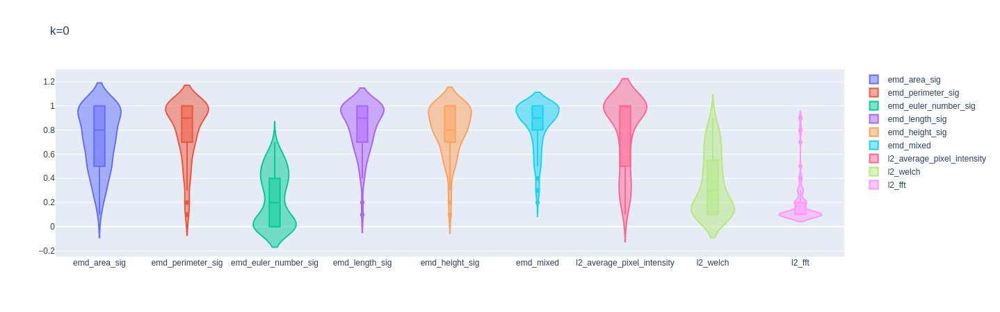

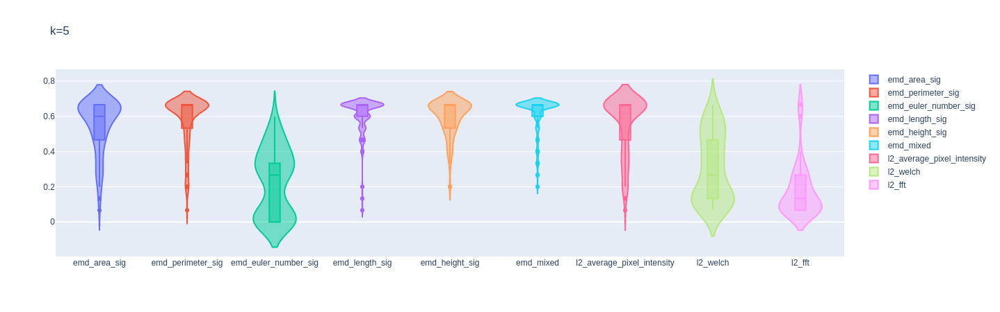

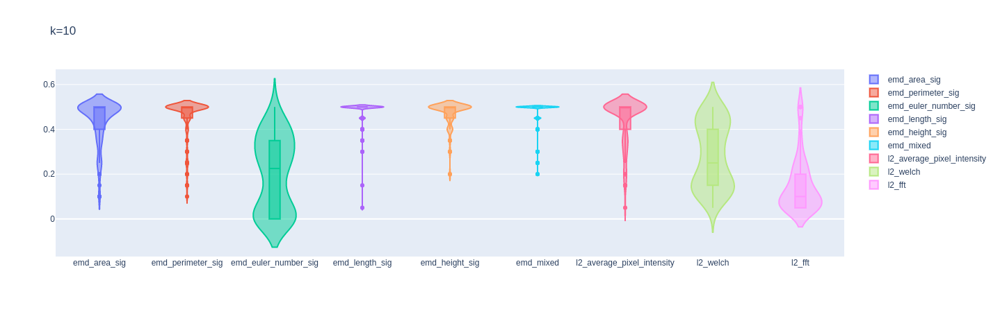

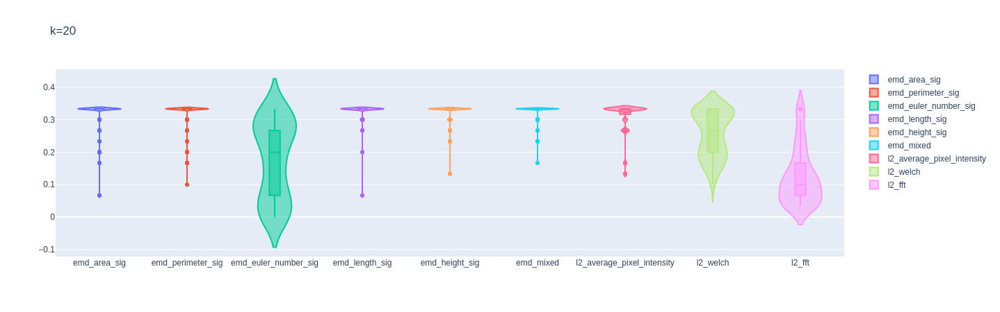

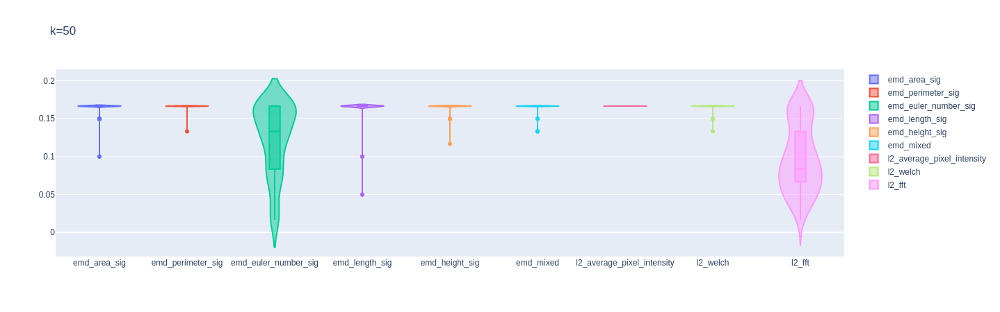

In [11]:
for k in k_vals:
    fig = go.Figure(
        layout=go.Layout(
            title=f'k={k}'
        )
    )

    for dist_name in dist_list:
        fig.add_trace(
            go.Violin(
                y=df_results[f'{dist_name}_accuracy_{k}'],
                box_visible=True,
                name=dist_name
            )
        )

    fig.show()

# Drawing

In [19]:
from PIL import Image, ImageDraw

In [313]:
def draw_circle(im, x, y, r):
    draw = ImageDraw.Draw(im)
    draw.ellipse((x, y, x+2*r, y+2*r), fill=0, outline=0)
    
def draw_rectangle(im, x, y, l, h):
    draw = ImageDraw.Draw(im)
    draw.rectangle((x, y, x+l, y+h), fill=0, outline=0)

def generate_morphology(circle_prob=0.5):
    im = Image.new('L', (400, 100), color=1)
    for idx in range(20):
        is_circle = (np.random.rand(1) < circle_prob).astype(bool)
        if is_circle:
            x, y, r = np.random.rand(3)
            draw_circle(
                im=im,
                x=int(idx*20),
                y=int(y*85),
                r=int(5 + r*5)
            )
        else:
            x, y, l, h = np.random.rand(4)
            draw_rectangle(
                im=im,
                x=int(idx*20),
                y=int(y*100),
                l=int(10 + l*5),
                h=int(10 + h*5)
            )
    return im

## Generate Circles

In [304]:
im = Image.new('L', (400, 100), color=1)

for idx in range(20):
    x, y, r = np.random.rand(3)
    draw_circle(
        im=im,
        x=int(idx*20),
        y=int(y*85),
        r=int(5 + r*5)
    )

get_image_figure(im)

FigureWidget({
    'data': [{'hoverinfo': 'none',
              'showscale': False,
              'type': 'hea…

## Generate Rectangles

In [305]:
im = Image.new('L', (400, 100), color=1)

for idx in range(20):
    x, y, l, h = np.random.rand(4)
    draw_rectangle(
        im=im,
        x=int(idx*20),
        y=int(y*100),
        l=int(10 + l*5),
        h=int(10 + h*5)
    )

get_image_figure(im)

FigureWidget({
    'data': [{'hoverinfo': 'none',
              'showscale': False,
              'type': 'hea…

# Generate a Mixture

In [306]:
im = Image.new('L', (400, 100), color=1)

for idx in range(20):
    is_circle = (np.random.rand(1) > 0.5).astype(bool)
    if is_circle:
        x, y, r = np.random.rand(3)
        draw_circle(
            im=im,
            x=int(idx*20),
            y=int(y*85),
            r=int(5 + r*5)
        )
    else:
        x, y, l, h = np.random.rand(4)
        draw_rectangle(
            im=im,
            x=int(idx*20),
            y=int(y*100),
            l=int(10 + l*5),
            h=int(10 + h*5)
        )

get_image_figure(im)

FigureWidget({
    'data': [{'hoverinfo': 'none',
              'showscale': False,
              'type': 'hea…

In [314]:
get_image_figure(generate_morphology())

FigureWidget({
    'data': [{'hoverinfo': 'none',
              'showscale': False,
              'type': 'hea…